In [1]:
import os 
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.image import ImageDataGenerator
import keras 
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm


ImportError: cannot import name 'ImageDataGenerator' from 'keras.preprocessing.image' (C:\Users\dsmat\AppData\Roaming\Python\Python311\site-packages\keras\api\preprocessing\image\__init__.py)

In [3]:
images = []
labels = []
for subfolder in tqdm(os.listdir('/kaggle/input/asl-dataset/asl_dataset')):
    subfolder_path = os.path.join('/kaggle/input/asl-dataset/asl_dataset', subfolder)
    if not os.path.isdir(subfolder_path) or subfolder=='asl_dataset':
        continue
    for image_filename in os.listdir(subfolder_path):
        image_path = os.path.join(subfolder_path, image_filename)
        images.append(image_path)
        labels.append(subfolder)
df = pd.DataFrame({'image': images, 'label': labels})
df

100%|██████████| 37/37 [00:01<00:00, 19.39it/s]


,image,label
0,/kaggle/input/asl-dataset/asl_dataset/n/hand2_...,n
1,/kaggle/input/asl-dataset/asl_dataset/n/hand1_...,n
2,/kaggle/input/asl-dataset/asl_dataset/n/hand2_...,n
3,/kaggle/input/asl-dataset/asl_dataset/n/hand1_...,n
4,/kaggle/input/asl-dataset/asl_dataset/n/hand2_...,n
...,...,...
2510,/kaggle/input/asl-dataset/asl_dataset/j/hand4_...,j
2511,/kaggle/input/asl-dataset/asl_dataset/j/hand1_...,j
2512,/kaggle/input/asl-dataset/asl_dataset/j/hand1_...,j
2513,/kaggle/input/asl-dataset/asl_dataset/j/hand1_...,j


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


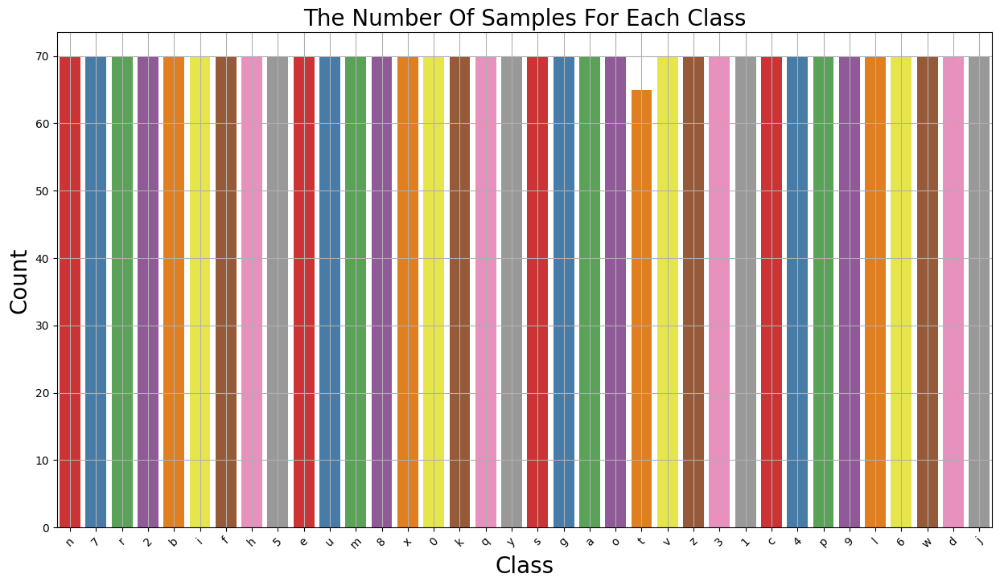

In [4]:
plt.figure(figsize=(15,8))
ax = sns.countplot(x=df.label,palette='Set1')
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.title('The Number Of Samples For Each Class',fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

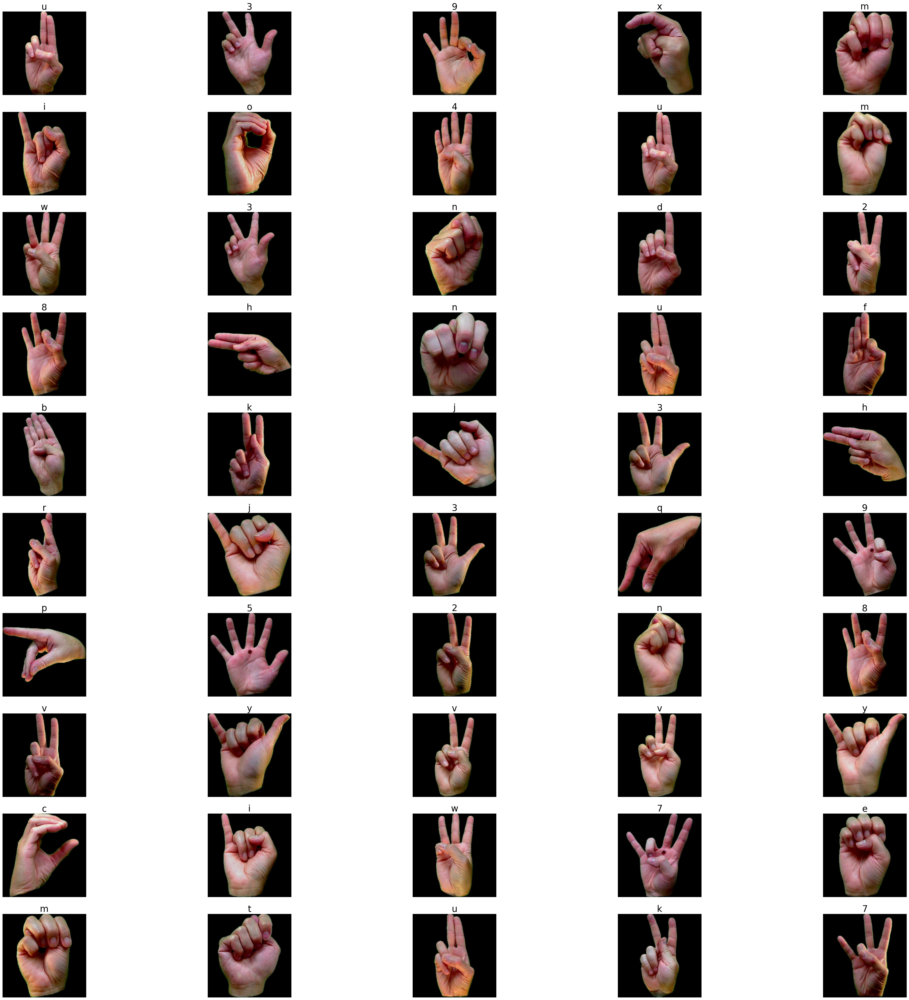

In [5]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(df),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=25)

In [6]:
X_train, X_test1, y_train, y_test1 = train_test_split(df['image'], df['label'], test_size=0.3, random_state=42,shuffle=True,stratify=df['label'])
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtyp

In [7]:
image_size = (224,224)
batch_size = 32
datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True
)
train_generator = datagen.flow_from_dataframe(
    df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)
test_generator = datagen.flow_from_dataframe(
    df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)
val_generator = datagen.flow_from_dataframe(
    df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

Found 1760 validated image filenames belonging to 36 classes.
Found 378 validated image filenames belonging to 36 classes.
Found 377 validated image filenames belonging to 36 classes.


In [8]:
base_model = tf.keras.applications.VGG16(input_shape=(224,224,3),include_top=False,weights='imagenet')
base_model.trainable = False
model=keras.models.Sequential()
model.add(base_model)
model.add(keras.layers.Flatten()) 
model.add(keras.layers.Dense(256,activation=tf.nn.relu))
model.add(keras.layers.Dropout(.3))
model.add(keras.layers.Dense(36,activation=tf.nn.softmax))
model.summary()

58889256/58889256 [==============================] - 2s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 256)               6422784   
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 36)                9252      
                                                                 
Total params: 21146724 (80.67 MB)
Trainable params: 6432036 (24.54 MB)
Non-trainable params: 14714688 (56.13 MB)
__________

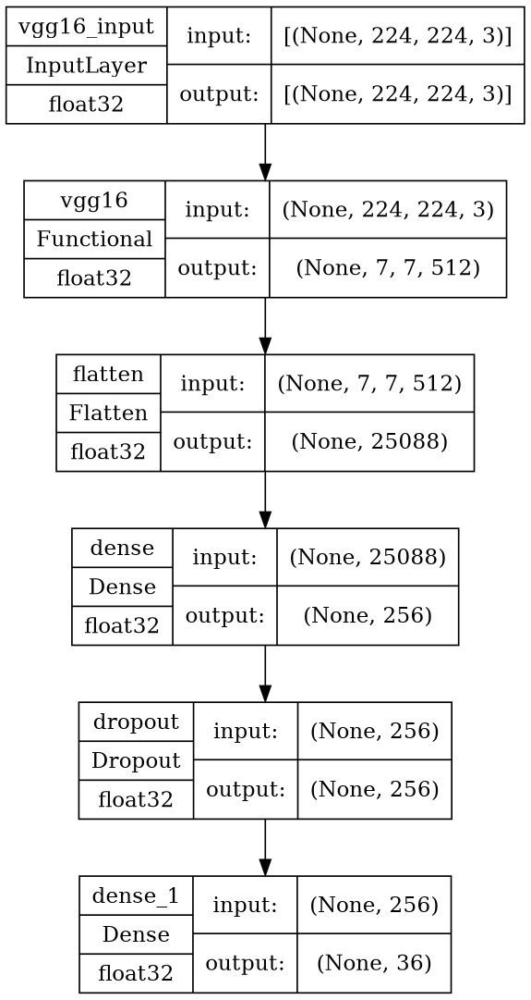

In [9]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [10]:
checkpoint_cb =ModelCheckpoint("ASL_model.h5", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=5, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist = model.fit(train_generator, epochs=20, validation_data=val_generator, callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/20
55/55 [==============================] - ETA: 0s - loss: 2.5920 - accuracy: 0.3352

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


55/55 [==============================] - 33s 464ms/step - loss: 2.5920 - accuracy: 0.3352 - val_loss: 1.0324 - val_accuracy: 0.7613
Epoch 2/20
55/55 [==============================] - 8s 153ms/step - loss: 0.9603 - accuracy: 0.7250 - val_loss: 0.4498 - val_accuracy: 0.9072
Epoch 3/20
55/55 [==============================] - 9s 153ms/step - loss: 0.5965 - accuracy: 0.8284 - val_loss: 0.2942 - val_accuracy: 0.9125
Epoch 4/20
55/55 [==============================] - 9s 155ms/step - loss: 0.4411 - accuracy: 0.8830 - val_loss: 0.2890 - val_accuracy: 0.9151
Epoch 5/20
55/55 [==============================] - 9s 158ms/step - loss: 0.3577 - accuracy: 0.8926 - val_loss: 0.2118 - val_accuracy: 0.9284
Epoch 6/20
55/55 [==============================] - 9s 159ms/step - loss: 0.2888 - accuracy: 0.9114 - val_loss: 0.1970 - val_accuracy: 0.9257
Epoch 7/20
55/55 [==============================] - 9s 161ms/step - loss: 0.2568 - accuracy: 0.9273 - val_loss: 0.1730 - val_accuracy: 0.9363
Epoch 8/20
55/55

In [11]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,val_loss,val_accuracy
0,2.591974,0.335227,1.032371,0.761273
1,0.960279,0.725000,0.449801,0.907162
2,0.596539,0.828409,0.294177,0.912467
3,0.441064,0.882955,0.289034,0.915119
4,0.357723,0.892614,0.211784,0.928382
5,0.288787,0.911364,0.197024,0.925729
6,0.256821,0.927273,0.173011,0.936339
7,0.219397,0.931818,0.153371,0.957560
8,0.212833,0.938636,0.132581,0.944297
9,0.174236,0.946591,0.153614,0.936339


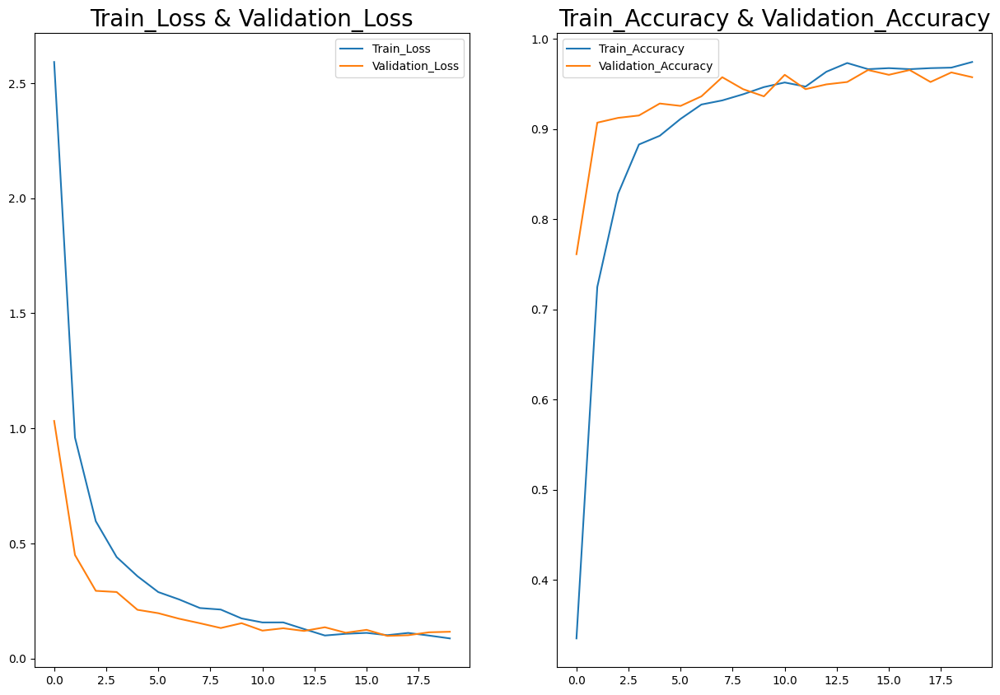

In [12]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.show()

In [13]:
score, acc= model.evaluate(test_generator)
print('Test Loss =', score)
print('Test Accuracy =', acc)

12/12 [==============================] - 7s 639ms/step - loss: 0.0780 - accuracy: 0.9788
Test Loss = 0.07800943404436111
Test Accuracy = 0.9788359999656677


In [14]:
y_test =test_generator.classes
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions,axis=1)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
df

12/12 [==============================] - 2s 135ms/step


,Actual,Prediction
0,17,17
1,29,29
2,0,24
3,6,6
4,11,11
...,...,...
373,30,30
374,35,35
375,10,10
376,20,20


In [15]:
dict_=train_generator.class_indices
def get_Name(N):
    for x,y in dict_.items():
        if y==N:
            return x
get_Name(10)

'a'

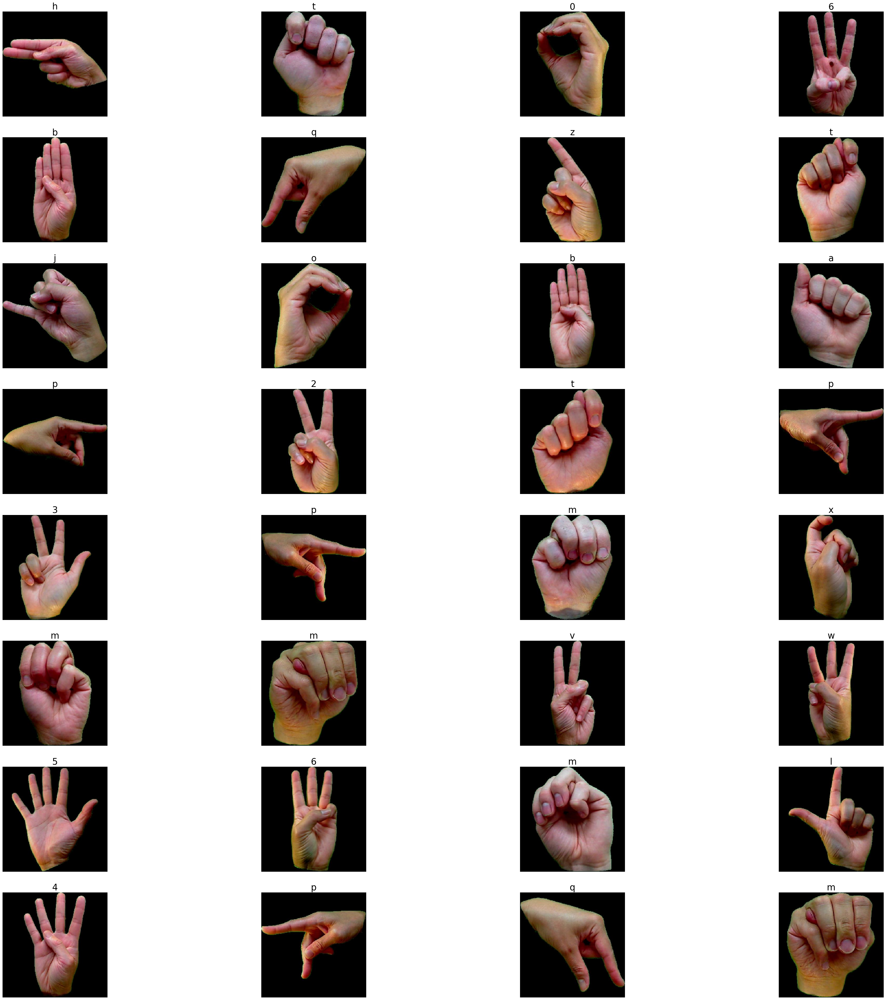

In [16]:
batch = next(test_generator)
images= batch[0]
plt.figure(figsize=(50,50))
for n in range(32):
    plt.subplot(8,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(get_Name(int(y_test[n])),fontsize=25)

array([[ 8,  0,  0, ...,  0,  0,  0],
       [ 0, 11,  0, ...,  0,  0,  0],
       [ 0,  0, 11, ...,  0,  0,  0],
       ...,
       [ 0,  0,  0, ..., 11,  0,  0],
       [ 0,  0,  0, ...,  0, 10,  0],
       [ 0,  1,  0, ...,  0,  0,  9]])

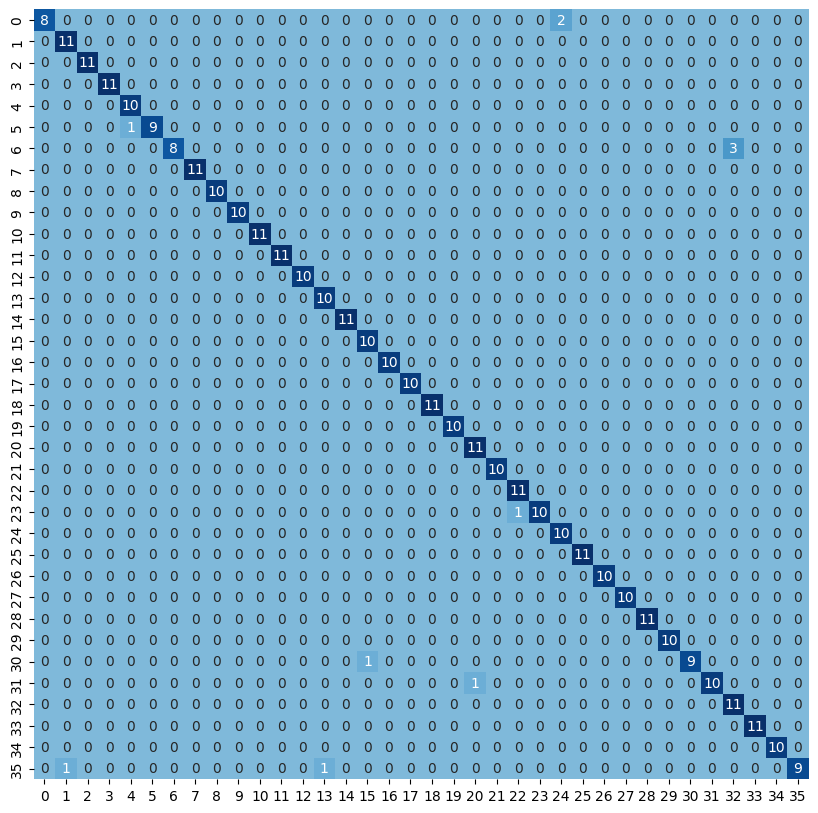

In [17]:
plt.figure(figsize=(10,10))
CM = confusion_matrix(y_test,y_pred)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [18]:
ClassificationReport = classification_report(y_test,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       1.00      0.80      0.89        10
           1       0.92      1.00      0.96        11
           2       1.00      1.00      1.00        11
           3       1.00      1.00      1.00        11
           4       0.91      1.00      0.95        10
           5       1.00      0.90      0.95        10
           6       1.00      0.73      0.84        11
           7       1.00      1.00      1.00        11
           8       1.00      1.00      1.00        10
           9       1.00      1.00      1.00        10
          10       1.00      1.00      1.00        11
          11       1.00      1.00      1.00        11
          12       1.00      1.00      1.00        10
          13       0.91      1.00      0.95        10
          14       1.00      1.00      1.00        11
          15       0.91      1.00      0.95        10
          16       1.00      1.00      1.00        10

1/1 [==============================] - 0s 154ms/step
The predicted label for the input image is: p


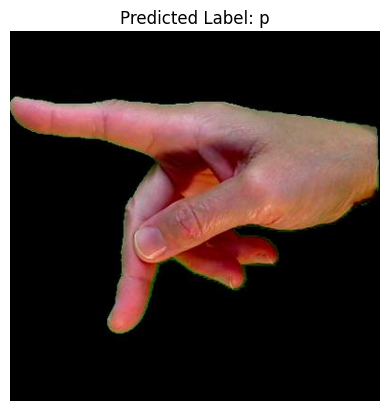

In [21]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
class_labels = '0123456789abcdefghijklmnopqrstuvwxyz'

def preprocess_image(image_path):
    img = load_img(image_path, target_size=(224,224))  
    img_array = img_to_array(img)  
    img_array = img_array / 255.0  
    img_array = np.expand_dims(img_array, axis=0)  
    return img_array

def classify_image(image_path):
    img_array = preprocess_image(image_path)
    prediction = model.predict(img_array)
    predicted_class = np.argmax(prediction)
    predicted_label = class_labels[predicted_class]  
    return predicted_label
image_path = '/kaggle/input/asl-dataset/asl_dataset/p/hand1_p_bot_seg_1_cropped.jpeg'  
predicted_label = classify_image(image_path)
print(f'The predicted label for the input image is: {predicted_label}')
img = load_img(image_path)
plt.imshow(img)
plt.title(f'Predicted Label: {predicted_label}')
plt.axis('off')
plt.show()


1/1 [==============================] - 0s 21ms/step
The predicted label for the input image is: 0


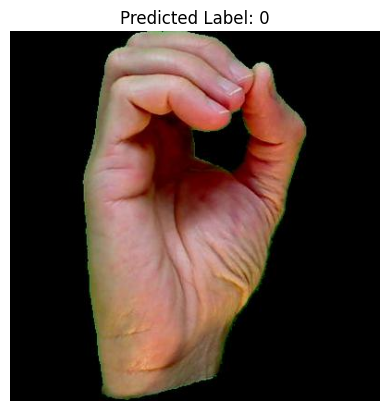

In [22]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
class_labels = '0123456789abcdefghijklmnopqrstuvwxyz'

def preprocess_image(image_path):
    img = load_img(image_path, target_size=(224,224))  
    img_array = img_to_array(img)  
    img_array = img_array / 255.0  
    img_array = np.expand_dims(img_array, axis=0)  
    return img_array

def classify_image(image_path):
    img_array = preprocess_image(image_path)
    prediction = model.predict(img_array)
    predicted_class = np.argmax(prediction)
    predicted_label = class_labels[predicted_class]  
    return predicted_label
image_path = '/kaggle/input/asl-dataset/asl_dataset/0/hand1_0_bot_seg_3_cropped.jpeg'  
predicted_label = classify_image(image_path)
print(f'The predicted label for the input image is: {predicted_label}')
img = load_img(image_path)
plt.imshow(img)
plt.title(f'Predicted Label: {predicted_label}')
plt.axis('off')
plt.show()
